<a href="https://colab.research.google.com/github/ColleyMo/MSc-Dissertation/blob/main/DissertationProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

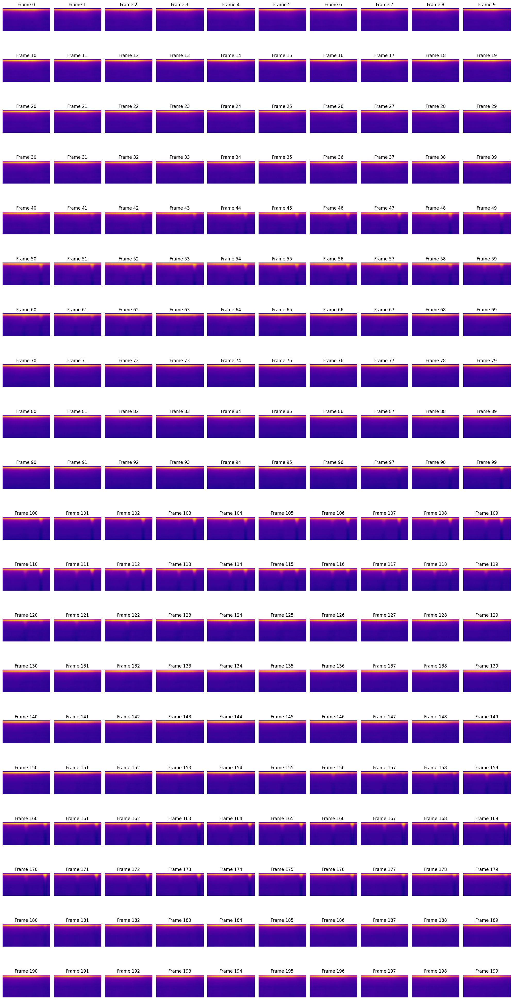

In [10]:
import scipy.io
import matplotlib.pyplot as plt
import numpy as np

# Load the .mat file
mat_data = scipy.io.loadmat("/content/P1X1_train_norm.mat")

# Assuming the relevant data is in the key 'P1X1_train_norm'
# You might need to change the key based on your .mat file structure
data = mat_data['P1X1_train_norm']

# Visualize all frames
total_frames = data.shape[2]
num_frames_to_plot = total_frames

# Determine grid size for subplots
n_cols = 10 # Number of columns in the grid, adjust as needed
n_rows = (num_frames_to_plot + n_cols - 1) // n_cols # Calculate number of rows

# Visualize all frames
plt.figure(figsize=(n_cols * 2, n_rows * 2)) # Adjust figure size for a grid layout
for i in range(total_frames):
    plt.subplot(n_rows, n_cols, i + 1)
    plt.imshow(data[:, :, i], cmap='plasma') # Assuming grayscale images
    plt.title(f'Frame {i}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Task
Provide a step-by-step plan for analyzing the video data, starting from data inspection and ending with either further analysis or deployment.

## Data inspection

### Subtask:
Examine the visualized frames and the data's shape and type to understand its characteristics.


In [15]:
print("Shape of the data array:", data.shape)
print("Data type of the data array:", data.dtype)

Shape of the data array: (120, 250, 200)
Data type of the data array: float64


## Preprocessing


apply normalization, resizing, or filtering.


**Reasoning**:
Reshape the data to have frames as the first dimension and normalize the pixel values to the range [0, 1].



In [16]:
# Reshape the data to have frames as the first dimension
preprocessed_data = np.transpose(data, (2, 0, 1))

# Normalize pixel values to the range [0, 1]
preprocessed_data = preprocessed_data / preprocessed_data.max()

print("Shape of preprocessed data:", preprocessed_data.shape)
print("Min pixel value:", preprocessed_data.min())
print("Max pixel value:", preprocessed_data.max())

Shape of preprocessed data: (200, 120, 250)
Min pixel value: -0.034678007066130265
Max pixel value: 1.0


## Feature extraction

### Subtask:
If applicable, extract relevant features from the frames.


**Reasoning**:
Reshape each frame into a 1D vector and stack them into a single 2D array.



In [17]:
# Reshape each frame into a 1D vector and stack them
features = preprocessed_data.reshape(preprocessed_data.shape[0], -1)
print("Shape of the features array:", features.shape)

Shape of the features array: (200, 30000)


## Model selection and training

### Subtask:
Choose an appropriate model based on the task and train it using the prepared data.


**Reasoning**:
Based on the previous steps, the data is prepared as a 2D array of features. The task is to choose and train a model. Since no specific task is mentioned (like classification or clustering), and given the nature of video data which often involves temporal dependencies or inherent structure, a simple approach might be dimensionality reduction or exploring potential groupings. However, without a clear objective (e.g., predicting a label, grouping similar frames), training a supervised model is not feasible. A common unsupervised task on such data could be clustering to find groups of similar frames or dimensionality reduction for visualization or noise reduction. Let's assume for the sake of proceeding that we want to explore potential clusters in the data. We can use K-Means clustering, which is a common unsupervised learning algorithm for finding clusters in data. Since we don't have labels, we will train the model on the entire feature set. We will choose a reasonable number of clusters (e.g., 3) for demonstration purposes, acknowledging that in a real scenario, determining the optimal number of clusters would require further analysis (e.g., using the elbow method or silhouette score).



In [18]:
from sklearn.cluster import KMeans

# Determine the specific machine learning task: Clustering
# Select a suitable model: KMeans
# No need to split data for unsupervised learning like KMeans

# Instantiate the chosen model (assuming 3 clusters)
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)

# Train the model using the features data
kmeans.fit(features)

# The trained model is now stored in the 'kmeans' variable
print("KMeans model training completed.")

KMeans model training completed.


## Evaluation

### Subtask:
Evaluate the model's performance using appropriate metrics.


**Reasoning**:
Calculate and print the inertia and silhouette score for the fitted KMeans model to evaluate its performance.



In [19]:
from sklearn.metrics import silhouette_score

# Calculate the inertia
inertia = kmeans.inertia_

# Calculate the silhouette score
# The silhouette score requires at least 2 clusters and more than 1 sample
if features.shape[0] > 1 and kmeans.n_clusters > 1:
  silhouette_avg = silhouette_score(features, kmeans.labels_)
else:
  silhouette_avg = "N/A (requires more than 1 sample and >1 cluster)"

# Print the inertia and silhouette score
print(f"Inertia: {inertia}")
print(f"Silhouette Score: {silhouette_avg}")

Inertia: 665.4028055345451
Silhouette Score: 0.5238879603193781


## Further analysis or deployment

### Subtask:
Based on the evaluation, perform further analysis, refine the model, or deploy it.


Inertia: 665.4028055345451
Silhouette Score: 0.5238879603193781

Interpretation:
The inertia of 665.4028 represents the sum of squared distances of samples to their closest cluster center. A lower inertia generally indicates better clustering.
The silhouette score of 0.5239 measures how similar an object is to its own cluster compared to other clusters. A score close to 1 indicates that the data point is far away from the neighboring clusters, a score of 0 means the data point is on or very close to the decision boundary between two neighboring clusters, and negative values indicate that those data points might have been assigned to the wrong cluster. A score of 0.52 suggests reasonably good clustering.

Decision and Next Steps:
Based on the silhouette score of 0.52, the clustering appears reasonably good. To further understand the clusters, we will now visualize representative frames from each cluster.
This will help us qualitatively assess the characteristics of the frames grouped in

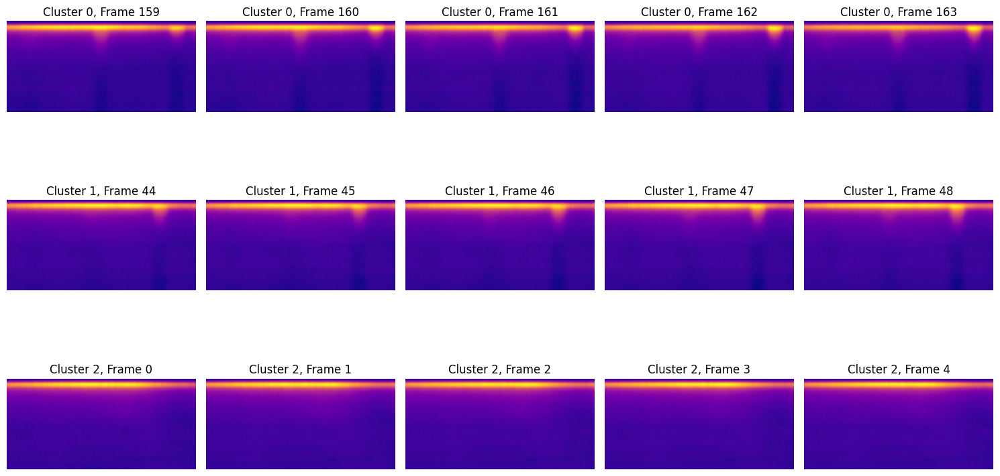

In [20]:
# Interpretation of Inertia and Silhouette Score
print(f"Inertia: {inertia}")
print(f"Silhouette Score: {silhouette_avg}")

print("\nInterpretation:")
print(f"The inertia of {inertia:.4f} represents the sum of squared distances of samples to their closest cluster center. A lower inertia generally indicates better clustering.")
print(f"The silhouette score of {silhouette_avg:.4f} measures how similar an object is to its own cluster compared to other clusters. A score close to 1 indicates that the data point is far away from the neighboring clusters, a score of 0 means the data point is on or very close to the decision boundary between two neighboring clusters, and negative values indicate that those data points might have been assigned to the wrong cluster. A score of 0.52 suggests reasonably good clustering.")

# Decision and Next Steps
print("\nDecision and Next Steps:")
print("Based on the silhouette score of 0.52, the clustering appears reasonably good. To further understand the clusters, we will now visualize representative frames from each cluster.")
print("This will help us qualitatively assess the characteristics of the frames grouped into each cluster and determine if the clustering is meaningful in the context of the video data.")
print("If the visualization reveals distinct and meaningful patterns within each cluster, we can proceed with further analysis on these clusters (e.g., analyzing temporal distribution).")
print("If the clustering is not satisfactory, we might consider refining the model by trying a different number of clusters or a different clustering algorithm.")

# Visualize representative frames from each cluster
# Get the cluster labels for each frame
cluster_labels = kmeans.labels_

# Find the indices of frames belonging to each cluster
frames_per_cluster = {}
for i, label in enumerate(cluster_labels):
    if label not in frames_per_cluster:
        frames_per_cluster[label] = []
    frames_per_cluster[label].append(i)

# Select a few representative frames from each cluster (e.g., the first 5)
num_representative_frames = 5
plt.figure(figsize=(num_representative_frames * 3, kmeans.n_clusters * 3))

for cluster_label in sorted(frames_per_cluster.keys()):
    representative_indices = frames_per_cluster[cluster_label][:num_representative_frames]
    for i, frame_index in enumerate(representative_indices):
        plt.subplot(kmeans.n_clusters, num_representative_frames, cluster_label * num_representative_frames + i + 1)
        # Use the original data for visualization before preprocessing
        plt.imshow(data[:, :, frame_index], cmap='plasma')
        plt.title(f'Cluster {cluster_label}, Frame {frame_index}')
        plt.axis('off')

plt.tight_layout()
plt.show()

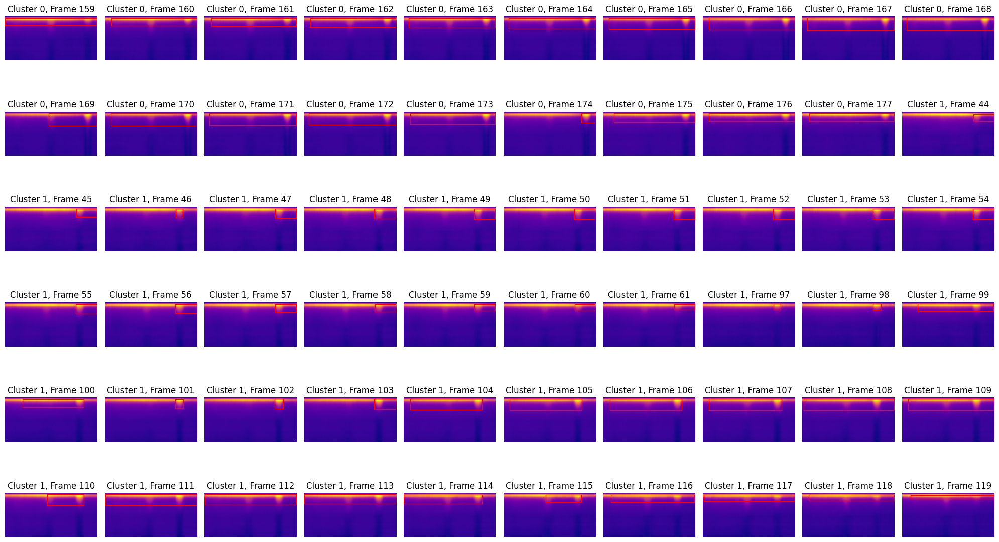

In [15]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# Assuming the 'data' variable is available from the initial data loading step (_cspNAnh7hY1)

# Preprocessing: Reshape and normalize the data
# Reshape the data to have frames as the first dimension
preprocessed_data = np.transpose(data, (2, 0, 1))

# Normalize pixel values to the range [0, 1]
preprocessed_data = preprocessed_data / preprocessed_data.max()

# Feature extraction: Reshape each frame into a 1D vector
features = preprocessed_data.reshape(preprocessed_data.shape[0], -1)

# Train the KMeans model
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
kmeans.fit(features)

# Select a representative frame from Cluster 2 as a reference
# For simplicity, let's use the first frame assigned to Cluster 2
cluster_labels = kmeans.labels_
cluster_2_indices = [i for i, label in enumerate(cluster_labels) if label == 2]

if not cluster_2_indices:
    print("Cluster 2 is empty. Cannot use it as a reference.")
else:
    reference_frame_index = cluster_2_indices[0]
    reference_frame = data[:, :, reference_frame_index]

    # Iterate through all frames in Cluster 0 and Cluster 1
    clusters_to_compare = [0, 1]
    difference_threshold = 0.1 # Adjust this threshold as needed

    all_frames_to_plot = []
    for cluster_label in clusters_to_compare:
        cluster_indices = [i for i, label in enumerate(cluster_labels) if label == cluster_label]
        all_frames_to_plot.extend([(frame_index, cluster_label) for frame_index in cluster_indices])

    total_frames_to_plot = len(all_frames_to_plot)
    n_cols = 10  # Adjust as needed
    n_rows = (total_frames_to_plot + n_cols - 1) // n_cols

    plt.figure(figsize=(n_cols * 2, n_rows * 2))
    plot_index = 1

    for frame_index, cluster_label in all_frames_to_plot:
        current_frame = data[:, :, frame_index]

        # Calculate the absolute difference between the current frame and the reference frame
        difference = np.abs(current_frame - reference_frame)

        # Identify areas where the difference is above the threshold
        anomalous_mask = difference > difference_threshold

        # Find the bounding box coordinates for anomalous areas
        rows, cols = np.where(anomalous_mask)

        plt.subplot(n_rows, n_cols, plot_index)
        plt.imshow(current_frame, cmap='plasma')
        plt.title(f'Cluster {cluster_label}, Frame {frame_index}')
        plt.axis('off')

        if rows.size > 0:
            min_row, max_row = np.min(rows), np.max(rows)
            min_col, max_col = np.min(cols), np.max(cols)

            # Draw a bounding box
            rect = plt.Rectangle((min_col, min_row), max_col - min_col, max_row - min_row,
                                 linewidth=1, edgecolor='red', facecolor='none')
            plt.gca().add_patch(rect)

        plot_index += 1

    plt.tight_layout()
    plt.show()

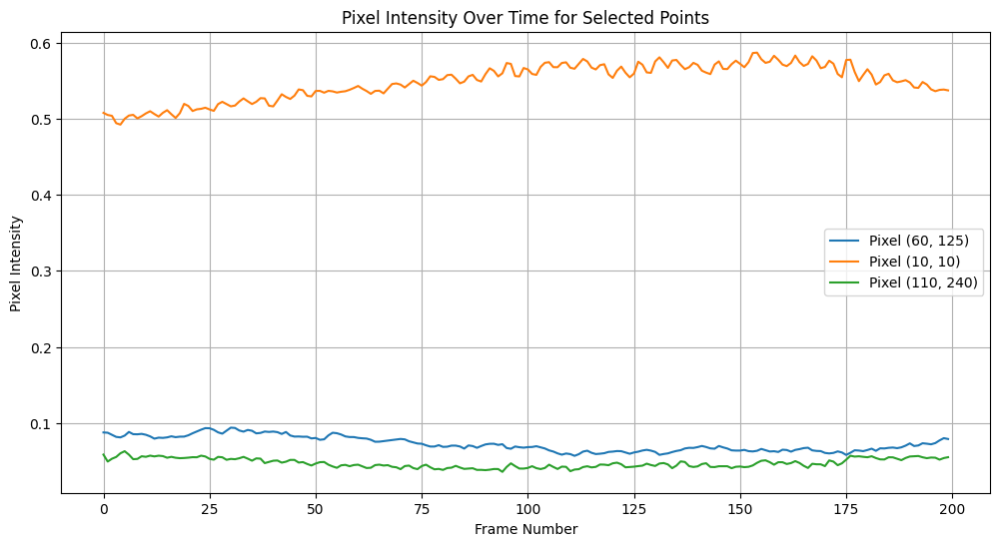

In [22]:
# Plot showing dataset structure (frames vs time, pixel intensities)
# Visualize pixel intensity over time for a few points

# Assuming 'data' is available from the initial data loading step (_cspNAnh7hY1)

# Get the dimensions of the data
num_rows, num_cols, num_frames = data.shape

# Select a few pixel coordinates to visualize
# We'll choose a few points across the frame to see variations
selected_pixels = [
    (num_rows // 2, num_cols // 2),  # Center pixel
    (10, 10),                       # Top-left
    (num_rows - 10, num_cols - 10)  # Bottom-right
]

plt.figure(figsize=(12, 6))

# Plot the intensity of each selected pixel over time
for r, c in selected_pixels:
    # Extract the time series for the selected pixel
    pixel_time_series = data[r, c, :]
    plt.plot(pixel_time_series, label=f'Pixel ({r}, {c})')

plt.xlabel('Frame Number')
plt.ylabel('Pixel Intensity')
plt.title('Pixel Intensity Over Time for Selected Points')
plt.legend()
plt.grid(True)
plt.show()

Visualizing representative frames from each cluster:


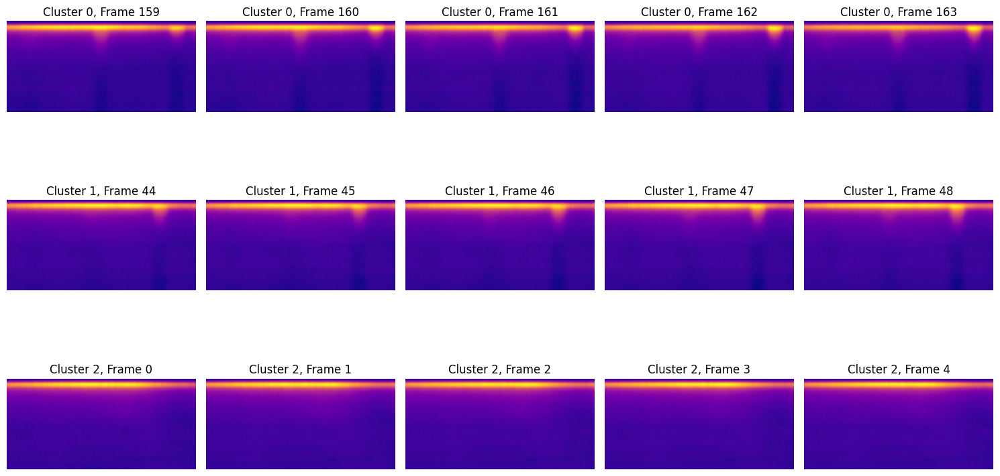

In [23]:
# Plot K-Means cluster maps (Visualization of representative frames per cluster)

# Assuming 'preprocessed_data' and 'cluster_labels' are available from previous steps

# Find the indices of frames belonging to each cluster
frames_per_cluster = {}
for i, label in enumerate(cluster_labels):
    if label not in frames_per_cluster:
        frames_per_cluster[label] = []
    frames_per_cluster[label].append(i)

# Visualize a selection of frames from each cluster
num_frames_to_visualize = 5 # Number of frames to show per cluster

print("Visualizing representative frames from each cluster:")

plt.figure(figsize=(num_frames_to_visualize * 3, len(frames_per_cluster) * 3))

for cluster_label in sorted(frames_per_cluster.keys()):
    representative_indices = frames_per_cluster[cluster_label][:num_frames_to_visualize]
    for i, frame_index in enumerate(representative_indices):
        plt.subplot(len(frames_per_cluster), num_frames_to_visualize, cluster_label * num_frames_to_visualize + i + 1)
        # Use the preprocessed_data for consistent visualization range [0, 1]
        plt.imshow(preprocessed_data[frame_index], cmap='plasma')
        plt.title(f'Cluster {cluster_label}, Frame {frame_index}')
        plt.axis('off')

plt.tight_layout()
plt.show()

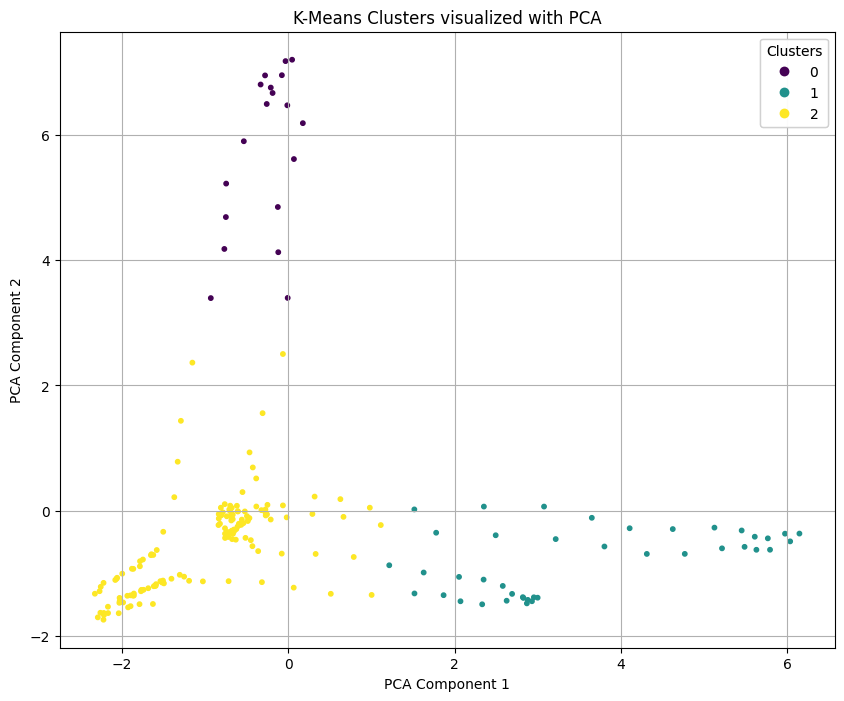

In [25]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assuming 'features' (the 1D vector representation of frames)
# and 'cluster_labels' (the KMeans assigned labels) are available

# Perform PCA to reduce the features to 2 dimensions for visualization
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(features)

# Create a scatter plot of the reduced features, colored by cluster label
plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=cluster_labels, cmap='viridis', s=10)

# Get the current axes and add the legend artist to it
ax = plt.gca()
legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)


plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('K-Means Clusters visualized with PCA')
plt.grid(True)
plt.show()

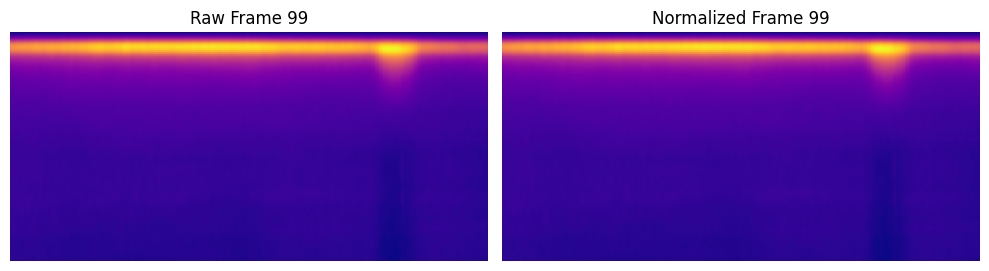

In [27]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'data' is available from the initial data loading step (_cspNAnh7hY1)

# Select a frame to visualize (e.g., the first frame)
frame_index_to_visualize = 99
raw_frame = data[:, :, frame_index_to_visualize]

# Normalize the selected frame using the same global max as used in preprocessing
# Assuming 'global_max' is available from the preprocessing step (cell 580f7e03 or c4ab5c35)
# If not, you might need to calculate it here or use a known range for your data
if 'global_max' in globals() and global_max > 0:
    normalized_frame = raw_frame / global_max
    normalization_applied = True
elif raw_frame.max() > 0:
     # Fallback: Normalize using the max of the current frame if global_max is not available or 0
     normalized_frame = raw_frame / raw_frame.max()
     normalization_applied = True
else:
    normalized_frame = raw_frame # No normalization if max is 0 or less
    normalization_applied = False
    print("Normalization skipped: Max pixel value is 0 or less.")


# Visualize the raw and normalized frames side-by-side
plt.figure(figsize=(10, 5))

# Plot the raw frame
plt.subplot(1, 2, 1)
plt.imshow(raw_frame, cmap='plasma')
plt.title(f'Raw Frame {frame_index_to_visualize}')
plt.axis('off')

# Plot the normalized frame
plt.subplot(1, 2, 2)
plt.imshow(normalized_frame, cmap='plasma')
if normalization_applied:
    plt.title(f'Normalized Frame {frame_index_to_visualize}')
else:
    plt.title(f'Frame {frame_index_to_visualize} (Normalization Skipped)')

plt.axis('off')

plt.tight_layout()
plt.show()

Number of frames assigned to each cluster in the test data:
Cluster 2: 200 frames


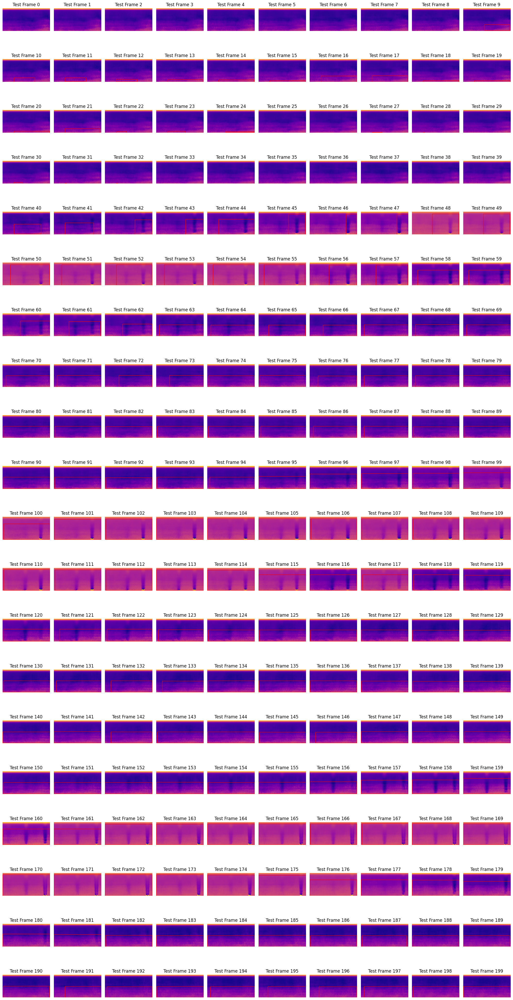

In [20]:
# Count the number of frames in each cluster for the test data
unique_labels, counts = np.unique(test_cluster_labels, return_counts=True)
print("Number of frames assigned to each cluster in the test data:")
for label, count in zip(unique_labels, counts):
    print(f"Cluster {label}: {count} frames")

# Visualize representative frames from each cluster in the test data with bounding boxes
# This helps in qualitatively assessing the clustering on the new data and highlighting differences
# Find the indices of frames belonging to each cluster in the test data
test_frames_per_cluster = {}
for i, label in enumerate(test_cluster_labels):
    if label not in test_frames_per_cluster:
        test_frames_per_cluster[label] = []
    test_frames_per_cluster[label].append(i)

# Select a representative frame from Cluster 2 as a reference for the test data
# For simplicity, let's use the first frame assigned to Cluster 2 in the test set
# Ensure Cluster 2 exists in the test data before proceeding
if 2 in test_frames_per_cluster and test_frames_per_cluster[2]:
    reference_frame_index_test = test_frames_per_cluster[2][0]
    reference_frame_test = test_data[:, :, reference_frame_index_test]
else:
    print("Cluster 2 is empty in the test data. Cannot use it as a reference for bounding boxes.")
    reference_frame_test = None # Set to None if no reference frame is available

# Visualize all frames from the test data with bounding boxes
frames_to_plot_indices = range(test_data.shape[2]) # Get indices for all frames in test_data

if not frames_to_plot_indices:
    print("No frames to plot from the test data.")
else:
    n_cols = 10  # Number of columns in the grid, adjust as needed
    n_rows = (len(frames_to_plot_indices) + n_cols - 1) // n_cols # Calculate number of rows

    plt.figure(figsize=(n_cols * 2, n_rows * 2)) # Adjust figure size for a grid layout

    difference_threshold = 0.1 # Adjust this threshold as needed

    for i, frame_index in enumerate(frames_to_plot_indices):
        plt.subplot(n_rows, n_cols, i + 1)
        current_frame = test_data[:, :, frame_index]
        plt.imshow(current_frame, cmap='plasma')
        plt.title(f'Test Frame {frame_index}')
        plt.axis('off')

        # Add bounding box if a reference frame exists
        if reference_frame_test is not None:
            # Calculate the absolute difference between the current frame and the reference frame
            difference = np.abs(current_frame - reference_frame_test)

            # Identify areas where the difference is above the threshold
            anomalous_mask = difference > difference_threshold

            # Find the bounding box coordinates for anomalous areas
            rows, cols = np.where(anomalous_mask)

            if rows.size > 0:
                min_row, max_row = np.min(rows), np.max(rows)
                min_col, max_col = np.min(cols), np.max(cols)

                # Draw a bounding box
                rect = plt.Rectangle((min_col, min_row), max_col - min_col, max_row - min_row,
                                     linewidth=1, edgecolor='red', facecolor='none')
                plt.gca().add_patch(rect)

    plt.tight_layout()
    plt.show()

# Task
Train a YOLO model using video frames and cluster pseudo-labels.

## Prepare data for yolo

### Subtask:
Convert the video frames and their corresponding cluster pseudo-labels into a format suitable for training a YOLO model

In [10]:
import os
import shutil
import numpy as np
from PIL import Image
import scipy.io
# Import KMeans here
from sklearn.cluster import KMeans

# Define base directory for YOLO dataset
yolo_data_dir = "yolo_dataset"

# Create directories for images and labels
image_dir_train = os.path.join(yolo_data_dir, "images", "train")
label_dir_train = os.path.join(yolo_data_dir, "labels", "train")

# Remove existing directories if they exist
if os.path.exists(yolo_data_dir):
    shutil.rmtree(yolo_data_dir)

os.makedirs(image_dir_train)
os.makedirs(label_dir_train)

# --- Incorporate Data Loading, Preprocessing, and Clustering ---

# Load the .mat file (assuming the file path from cell _cspNAnh7hY1)
mat_data = scipy.io.loadmat("/content/P1X2_train_norm.mat")

# Assuming the relevant data is in the key 'P1X1_train_norm'
# You might need to change the key based on your .mat file structure
# Use a more robust way to get the key as in cell VnX8yMpDUKvE
data_filename = "/content/P1X2_train_norm.mat"
data_key = os.path.splitext(os.path.basename(data_filename))[0]
if data_key in mat_data:
    data = mat_data[data_key]
    print(f"Successfully loaded data from key: {data_key}")
else:
     print(f"Could not find data in key '{data_key}'. Available keys: {mat_data.keys()}")
     # Fallback to a common key pattern if the direct key is not found
     data_keys_pattern = [key for key in mat_data.keys() if key.endswith('_train_norm')]
     if data_keys_pattern:
         data_key = data_keys_pattern[0]
         data = mat_data[data_key]
         print(f"Attempting to load data from key: {data_key}")
     else:
         raise KeyError(f"Could not find a suitable data key in {data_filename}")


# Preprocessing: Reshape and normalize the data (from cell 580f7e03)
# Reshape the data to have frames as the first dimension
preprocessed_data = np.transpose(data, (2, 0, 1))

# Normalize pixel values to the range [0, 1]
# Use a small epsilon to avoid division by zero if max is 0
global_max = preprocessed_data.max()
if global_max > 0:
    preprocessed_data = preprocessed_data / global_max
else:
    # Handle case where max is 0 or negative (if applicable)
    print("Max pixel value is 0 or less, skipping normalization by division.")


# Feature extraction: Reshape each frame into a 1D vector (from cell 53ecab44)
features = preprocessed_data.reshape(preprocessed_data.shape[0], -1)

# Clustering: Train KMeans model (from cell e5ae9c38)
# Instantiate the chosen model (assuming 3 clusters, as used previously)
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10) # Added n_init for KMeans
# Train the model using the features data
kmeans.fit(features)
# Get the cluster labels
cluster_labels = kmeans.labels_

# --- End of Incorporated Steps ---


# Use all indices for training
train_indices = np.arange(preprocessed_data.shape[0])

# Process training data
for i in train_indices:
    frame = preprocessed_data[i]
    label = cluster_labels[i]

    # Save frame as image
    # Convert to uint8 after scaling if necessary, ensure data is in [0, 1] before multiplying by 255
    img = Image.fromarray((frame * 255).astype(np.uint8), mode='L') # Assuming grayscale
    img_path = os.path.join(image_dir_train, f"frame_{i:04d}.png")
    img.save(img_path)

    # Create annotation file
    annotation_path = os.path.join(label_dir_train, f"frame_{i:04d}.txt")
    with open(annotation_path, "w") as f:
        # YOLO format: class_id center_x center_y width height
        # For the whole frame as one object: class_id 0.5 0.5 1.0 1.0
        f.write(f"{label} 0.5 0.5 1.0 1.0\n")

print(f"YOLO dataset created with all frames in training in '{yolo_data_dir}'")

Successfully loaded data from key: P1X2_train_norm


/tmp/ipython-input-2299085560.py:86: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  img = Image.fromarray((frame * 255).astype(np.uint8), mode='L') # Assuming grayscale


YOLO dataset created with all frames in training in 'yolo_dataset'


## Choose and configure yolo model

### Subtask:
Select a YOLO model architecture and configure it for training, considering the number of classes (based on the number of clusters).


## Train yolo model


Train the YOLO model using the prepared data and pseudo-labels.


In [11]:
import yaml
import numpy as np

# Determine the number of classes based on the unique cluster labels
num_classes = len(np.unique(cluster_labels))

# Create a list of class names
class_names = [f'cluster_{i}' for i in range(num_classes)]

# Define the content of the YAML configuration file
yolo_config = {
    'train': '../train',  # Path relative to the data.yaml file
    'val': '../val',      # Path relative to the data.yaml file
    'nc': num_classes,
    'names': class_names
}

# Define the path to save the YAML file
yolo_data_dir = "yolo_dataset"
config_path = os.path.join(yolo_data_dir, "data.yaml")

# Save the YAML configuration to a file
with open(config_path, 'w') as f:
    yaml.dump(yolo_config, f)

# Print the content of the created data.yaml file
print(f"Content of {config_path}:")
with open(config_path, 'r') as f:
    print(f.read())

Content of yolo_dataset/data.yaml:
names:
- cluster_0
- cluster_1
- cluster_2
nc: 3
train: ../train
val: ../val



In [5]:
%pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.3 MB/s eta 0:00:00


## Evaluate yolo model

### Subtask:
Evaluate the performance of the trained YOLO model using appropriate object detection metrics.


In [12]:
import yaml
import os
import numpy as np # Import numpy
from ultralytics import YOLO # Import YOLO

# Define the base directory for YOLO dataset
yolo_data_dir = "yolo_dataset"

# Define the content of the YAML configuration file with correct relative paths
yolo_config = {
    'train': 'images/train',  # Path relative to the yolo_data_dir
    'val': 'images/train',      # Set val to images/train to use training data for validation
    'nc': len(np.unique(cluster_labels)), # Assuming cluster_labels is available
    'names': [f'cluster_{i}' for i in range(len(np.unique(cluster_labels)))] # Assuming cluster_labels is available
}

# Define the path to save the YAML file
config_path = os.path.join(yolo_data_dir, "data.yaml")

# Save the updated YAML configuration to a file
with open(config_path, 'w') as f:
    yaml.dump(yolo_config, f)

# Print the content of the updated data.yaml file
print(f"Content of updated {config_path}:")
with open(config_path, 'r') as f:
    print(f.read())

# Now, train the YOLO model

# Instantiate a YOLO model
# Using 'yolov8n.pt' for transfer learning
model = YOLO('yolov8n.pt')

# Train the model
# data: path to the updated data.yaml file
# epochs: number of training epochs
# imgsz: image size (matching preprocessed frame dimensions)
# Note: Training progress and results will be printed to the console and saved in runs/detect/train...
model.train(data=config_path, epochs=100, imgsz=120) # Using 100 epochs

print("YOLO model training initiated with all data for training and validation.")

Content of updated yolo_dataset/data.yaml:
names:
- cluster_0
- cluster_1
- cluster_2
nc: 3
train: images/train
val: images/train

Ultralytics 8.3.184 🚀 Python-3.12.11 torch-2.8.0+cu126 CPU (Intel Xeon 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=120, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opse

train: Scanning /content/yolo_dataset/labels/train... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<00:00, 2375.41it/s]

train: New cache created: /content/yolo_dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 338.7±102.4 MB/s, size: 9.9 KB)



/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
val: Scanning /content/yolo_dataset/labels/train.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]

Plotting labels to runs/detect/train2/labels.jpg... 



/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 128 train, 128 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      1.523      3.828      1.593         26        128: 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.19it/s]

                   all        200        200     0.0192          1      0.637      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G       0.96      3.242      1.275         25        128: 100%|██████████| 13/13 [00:07<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.29it/s]

                   all        200        200     0.0219          1      0.459      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G     0.7646      2.486      1.123         20        128: 100%|██████████| 13/13 [00:06<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.12it/s]

                   all        200        200      0.228          1      0.587      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G     0.7886       1.75       1.09         30        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.23it/s]

                   all        200        200      0.596      0.667      0.844       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G     0.6704      1.425      1.019         23        128: 100%|██████████| 13/13 [00:08<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.16it/s]

                   all        200        200       0.69        0.6      0.673      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G     0.6054      1.261      1.004         25        128: 100%|██████████| 13/13 [00:07<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.20it/s]

                   all        200        200      0.251      0.989      0.486      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G     0.5604      1.181     0.9964         25        128: 100%|██████████| 13/13 [00:06<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.19it/s]

                   all        200        200      0.189      0.977      0.279      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G     0.5002      1.073     0.9698         24        128: 100%|██████████| 13/13 [00:08<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.14it/s]

                   all        200        200      0.253      0.877      0.375      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G     0.4985     0.9481     0.9766         17        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.16it/s]

                   all        200        200      0.622       0.66      0.488       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G     0.4503       0.94     0.9474         28        128: 100%|██████████| 13/13 [00:06<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        200        200      0.355      0.866      0.714      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G     0.4397     0.8768     0.9468         22        128: 100%|██████████| 13/13 [00:06<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.10it/s]

                   all        200        200      0.883      0.591      0.707      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G     0.4513      0.876     0.9547         28        128: 100%|██████████| 13/13 [00:07<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.16it/s]

                   all        200        200       0.54      0.828      0.711      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G     0.4827     0.8914     0.9539         25        128: 100%|██████████| 13/13 [00:07<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.07it/s]

                   all        200        200      0.517       0.88      0.665      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G     0.4328     0.8107     0.9449         22        128: 100%|██████████| 13/13 [00:06<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.39it/s]

                   all        200        200      0.483      0.787      0.635      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G     0.3812     0.7998     0.9371         22        128: 100%|██████████| 13/13 [00:07<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.14it/s]

                   all        200        200      0.462      0.656      0.659      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G      0.404     0.8099     0.9375         28        128: 100%|██████████| 13/13 [00:08<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200      0.515        0.8      0.704      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G     0.3932     0.8016     0.9295         20        128: 100%|██████████| 13/13 [00:07<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        200        200      0.632      0.732      0.718      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G     0.3718     0.7953     0.9257         26        128: 100%|██████████| 13/13 [00:06<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        200      0.567      0.862      0.744      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G     0.3589     0.7865      0.926         24        128: 100%|██████████| 13/13 [00:07<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.13it/s]

                   all        200        200      0.554      0.933      0.752      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G     0.3616     0.7581     0.9229         31        128: 100%|██████████| 13/13 [00:08<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.10it/s]

                   all        200        200      0.654      0.836      0.743      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G      0.364     0.7728      0.926         23        128: 100%|██████████| 13/13 [00:07<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.38it/s]

                   all        200        200      0.601      0.936      0.779      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G     0.3389     0.7647     0.9117         24        128: 100%|██████████| 13/13 [00:06<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.05it/s]

                   all        200        200      0.617      0.856      0.731      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G     0.3602      0.723     0.9348         24        128: 100%|██████████| 13/13 [00:07<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.11it/s]

                   all        200        200      0.558       0.86       0.75       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G     0.3233     0.7003     0.9158         25        128: 100%|██████████| 13/13 [00:08<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.11it/s]

                   all        200        200      0.569      0.857      0.833      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G     0.3203     0.7334     0.9208         28        128: 100%|██████████| 13/13 [00:07<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.30it/s]

                   all        200        200      0.549      0.842      0.805      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G     0.3249     0.7247     0.9171         30        128: 100%|██████████| 13/13 [00:07<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.07it/s]

                   all        200        200      0.921      0.608      0.769      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G     0.2891     0.7216     0.8987         28        128: 100%|██████████| 13/13 [00:07<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.16it/s]

                   all        200        200      0.779      0.553      0.614      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G     0.3141     0.6849     0.9046         21        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.08it/s]

                   all        200        200      0.425      0.863       0.65      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G     0.2987     0.7061     0.9115         26        128: 100%|██████████| 13/13 [00:07<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.27it/s]

                   all        200        200      0.642       0.85      0.823      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G     0.3205     0.7313     0.9184         28        128: 100%|██████████| 13/13 [00:06<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.19it/s]

                   all        200        200      0.527      0.861      0.725      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G     0.3004     0.6627     0.9054         24        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.14it/s]

                   all        200        200      0.479      0.853       0.62      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G     0.2979     0.7244     0.9068         28        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.13it/s]

                   all        200        200      0.419      0.691      0.631      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G     0.2847     0.6632     0.9043         27        128: 100%|██████████| 13/13 [00:07<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.21it/s]

                   all        200        200      0.604      0.933      0.768      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G     0.2704     0.6747     0.8957         27        128: 100%|██████████| 13/13 [00:06<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.16it/s]

                   all        200        200      0.614      0.918      0.768      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G     0.2673     0.6617     0.8951         21        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.09it/s]

                   all        200        200      0.596      0.936      0.812      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G     0.2835     0.6411     0.9106         30        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200       0.64      0.917      0.781      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G     0.2826     0.6273      0.893         24        128: 100%|██████████| 13/13 [00:06<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.09it/s]

                   all        200        200      0.608      0.839      0.802      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G     0.2633     0.6407     0.8938         22        128: 100%|██████████| 13/13 [00:06<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.12it/s]

                   all        200        200      0.489      0.867      0.751      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G     0.2719     0.6602     0.9093         25        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.13it/s]

                   all        200        200      0.554       0.86      0.778      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G     0.2859     0.6572     0.9146         27        128: 100%|██████████| 13/13 [00:08<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.17it/s]

                   all        200        200      0.707      0.857      0.827      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G     0.2567     0.5989     0.8992         25        128: 100%|██████████| 13/13 [00:06<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.13it/s]

                   all        200        200      0.478      0.857      0.803      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G     0.2595     0.6539     0.8915         30        128: 100%|██████████| 13/13 [00:06<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200      0.565      0.945      0.807      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G     0.2625     0.6076     0.8952         27        128: 100%|██████████| 13/13 [00:08<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.14it/s]

                   all        200        200      0.512      0.732      0.765      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G      0.249     0.6101      0.898         25        128: 100%|██████████| 13/13 [00:08<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.10it/s]

                   all        200        200      0.632      0.816      0.828      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G     0.2449       0.62     0.8801         30        128: 100%|██████████| 13/13 [00:06<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.32it/s]

                   all        200        200      0.654        0.8      0.756      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G     0.2424     0.5416      0.891         26        128: 100%|██████████| 13/13 [00:07<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.18it/s]

                   all        200        200      0.456      0.752      0.718      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G     0.2534     0.6263      0.896         26        128: 100%|██████████| 13/13 [00:08<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.07it/s]

                   all        200        200      0.698      0.769      0.815      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G     0.2483     0.5904     0.8865         27        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.10it/s]

                   all        200        200      0.532      0.659      0.733      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G     0.2462     0.5794     0.8902         25        128: 100%|██████████| 13/13 [00:06<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.31it/s]

                   all        200        200       0.83      0.543      0.659      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G     0.2449     0.5524     0.8915         26        128: 100%|██████████| 13/13 [00:07<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        200        200      0.631      0.787      0.766      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G     0.2407     0.5415     0.8878         25        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.03it/s]

                   all        200        200      0.912      0.589      0.762      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G     0.2531     0.6464     0.8967         20        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.80it/s]

                   all        200        200      0.457      0.906      0.794      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G     0.2375     0.5663     0.8747         28        128: 100%|██████████| 13/13 [00:06<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.27it/s]

                   all        200        200      0.474      0.928      0.697      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G     0.2335     0.5774     0.8941         31        128: 100%|██████████| 13/13 [00:07<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.10it/s]

                   all        200        200      0.537      0.861      0.762       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G     0.2288     0.5504     0.8972         24        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.16it/s]

                   all        200        200      0.595       0.82      0.857      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G     0.2269     0.5582     0.8741         22        128: 100%|██████████| 13/13 [00:08<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        200        200      0.651      0.869      0.853      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G      0.239     0.5525     0.8957         26        128: 100%|██████████| 13/13 [00:06<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        200        200      0.598      0.991      0.916      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G        0.2     0.5375     0.8832         29        128: 100%|██████████| 13/13 [00:07<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.14it/s]

                   all        200        200       0.72      0.984      0.944      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G     0.2145     0.5411     0.8815         30        128: 100%|██████████| 13/13 [00:08<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.21it/s]

                   all        200        200      0.655      0.918      0.846      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G     0.2174     0.5527     0.8859         27        128: 100%|██████████| 13/13 [00:08<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        200        200      0.741      0.827      0.879      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         0G     0.2087     0.4948     0.8867         29        128: 100%|██████████| 13/13 [00:06<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.33it/s]

                   all        200        200      0.678      0.955      0.951      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         0G        0.2     0.4997     0.8812         23        128: 100%|██████████| 13/13 [00:07<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.09it/s]

                   all        200        200      0.975      0.623      0.939      0.938



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         0G     0.1992     0.5534     0.8818         26        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.10it/s]

                   all        200        200      0.661      0.902      0.938      0.938



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G     0.1961      0.509     0.8761         24        128: 100%|██████████| 13/13 [00:07<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]

                   all        200        200      0.799      0.779      0.863      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G     0.1984     0.5104     0.8817         28        128: 100%|██████████| 13/13 [00:06<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.54it/s]

                   all        200        200      0.744      0.827      0.848      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G     0.1998     0.4876       0.89         26        128: 100%|██████████| 13/13 [00:07<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200      0.918      0.857      0.923      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G     0.1972     0.5086     0.8767         26        128: 100%|██████████| 13/13 [00:08<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.11it/s]

                   all        200        200      0.942      0.885      0.939      0.934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         0G     0.2002     0.4546     0.8736         24        128: 100%|██████████| 13/13 [00:07<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        200        200      0.908      0.904       0.94      0.935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G      0.197     0.4762     0.8747         30        128: 100%|██████████| 13/13 [00:06<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.53it/s]

                   all        200        200      0.785      0.935      0.944      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         0G     0.1922     0.5007     0.8699         25        128: 100%|██████████| 13/13 [00:07<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.19it/s]

                   all        200        200      0.952      0.868      0.961      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G     0.1975     0.4679     0.8817         26        128: 100%|██████████| 13/13 [00:08<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200      0.889      0.844      0.962      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G     0.1909      0.469     0.8793         28        128: 100%|██████████| 13/13 [00:07<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        200        200       0.76      0.817      0.852      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         0G      0.211     0.4569     0.8956         30        128: 100%|██████████| 13/13 [00:06<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        200        200      0.836      0.848      0.885      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100         0G     0.1833      0.458     0.8722         28        128: 100%|██████████| 13/13 [00:07<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.19it/s]

                   all        200        200      0.652      0.912      0.866      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G     0.1811     0.5001     0.8691         29        128: 100%|██████████| 13/13 [00:08<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.12it/s]

                   all        200        200      0.887      0.571      0.821      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100         0G     0.1777     0.4198     0.8777         23        128: 100%|██████████| 13/13 [00:07<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.52it/s]

                   all        200        200       0.75      0.951      0.934      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100         0G     0.1933     0.4508     0.8811         29        128: 100%|██████████| 13/13 [00:06<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        200        200      0.866      0.893      0.938      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G     0.1713     0.4618     0.8748         31        128: 100%|██████████| 13/13 [00:07<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200      0.932      0.919      0.975      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G     0.1878      0.459     0.8808         28        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200      0.863      0.969       0.96      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G      0.167     0.4696     0.8777         19        128: 100%|██████████| 13/13 [00:07<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.30it/s]

                   all        200        200      0.734      0.895      0.914      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G     0.1727      0.436     0.8814         25        128: 100%|██████████| 13/13 [00:06<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200      0.745      0.837      0.869      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G     0.1765     0.4763     0.8795         26        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200      0.663      0.807      0.821      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G     0.1711     0.4208     0.8797         25        128: 100%|██████████| 13/13 [00:08<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200      0.776      0.756      0.864      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         0G     0.1811     0.4152     0.8719         27        128: 100%|██████████| 13/13 [00:07<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.23it/s]

                   all        200        200      0.893      0.936       0.97      0.968



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G     0.1667     0.4303     0.8871         24        128: 100%|██████████| 13/13 [00:06<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.14it/s]

                   all        200        200      0.944      0.964      0.983      0.982



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100         0G      0.161     0.4265     0.8699         30        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.12it/s]

                   all        200        200      0.955      0.918      0.976      0.975



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G     0.1712     0.4184     0.8805         25        128: 100%|██████████| 13/13 [00:08<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.10it/s]

                   all        200        200      0.913       0.93      0.975      0.974



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G     0.1676     0.4584     0.8862         20        128: 100%|██████████| 13/13 [00:07<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        200        200      0.729      0.934      0.963      0.959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G     0.1601     0.4106     0.8872         31        128: 100%|██████████| 13/13 [00:06<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.13it/s]

                   all        200        200      0.774      0.946       0.95       0.95



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G     0.1529      0.416     0.8733         27        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.18it/s]

                   all        200        200      0.765      0.951      0.939      0.938


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
     91/100         0G     0.1511     0.9216     0.8473          8        128: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200      0.814       0.94      0.927      0.926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         0G     0.1436     0.5043     0.8396          8        128: 100%|██████████| 13/13 [00:06<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.11it/s]

                   all        200        200      0.827      0.955      0.949      0.949



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         0G     0.1384     0.4142     0.8343          8        128: 100%|██████████| 13/13 [00:06<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.14it/s]

                   all        200        200      0.892      0.931      0.984      0.984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100         0G     0.1278     0.3704     0.8414          8        128: 100%|██████████| 13/13 [00:07<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.15it/s]

                   all        200        200      0.954      0.962      0.986      0.986



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         0G     0.1115     0.3641     0.8472          8        128: 100%|██████████| 13/13 [00:07<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.09it/s]

                   all        200        200      0.956      0.975      0.984      0.984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G     0.1097     0.3022     0.8498          8        128: 100%|██████████| 13/13 [00:06<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.36it/s]

                   all        200        200      0.964      0.974      0.987      0.987



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G       0.11     0.2794     0.8404          8        128: 100%|██████████| 13/13 [00:07<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.14it/s]

                   all        200        200      0.988       0.98       0.99       0.99



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G     0.1031     0.3061     0.8347          8        128: 100%|██████████| 13/13 [00:07<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.18it/s]

                   all        200        200      0.986      0.956      0.987      0.987



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G     0.1127     0.2475     0.8349          8        128: 100%|██████████| 13/13 [00:07<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        200        200      0.987      0.955      0.985      0.985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         0G     0.1099     0.2829     0.8394          8        128: 100%|██████████| 13/13 [00:06<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        200        200      0.984      0.951      0.986      0.986



100 epochs completed in 0.285 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.184 🚀 Python-3.12.11 torch-2.8.0+cu126 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.23it/s]


                   all        200        200      0.988      0.981       0.99       0.99
             cluster_0        148        148      0.993      0.983      0.995      0.995
             cluster_1         19         19          1      0.998      0.995      0.995
             cluster_2         33         33      0.969      0.961       0.98       0.98
Speed: 0.1ms preprocess, 10.1ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs/detect/train2
YOLO model training initiated with all data for training and validation.


**Reasoning**:
Load the trained YOLO model and evaluate it on the validation dataset.



Successfully loaded data from key: P2X1_train_norm
Normalized test data using training data max (1.0)
Predicted cluster labels for test data.
Attempting to load model from: runs/detect/train2/weights/best.pt
Running YOLO predictions on 200 test frames for overlay...
YOLO predictions on test data for overlay complete.
Visualizing 50 test frames with bounding boxes for clusters 0 and 1...


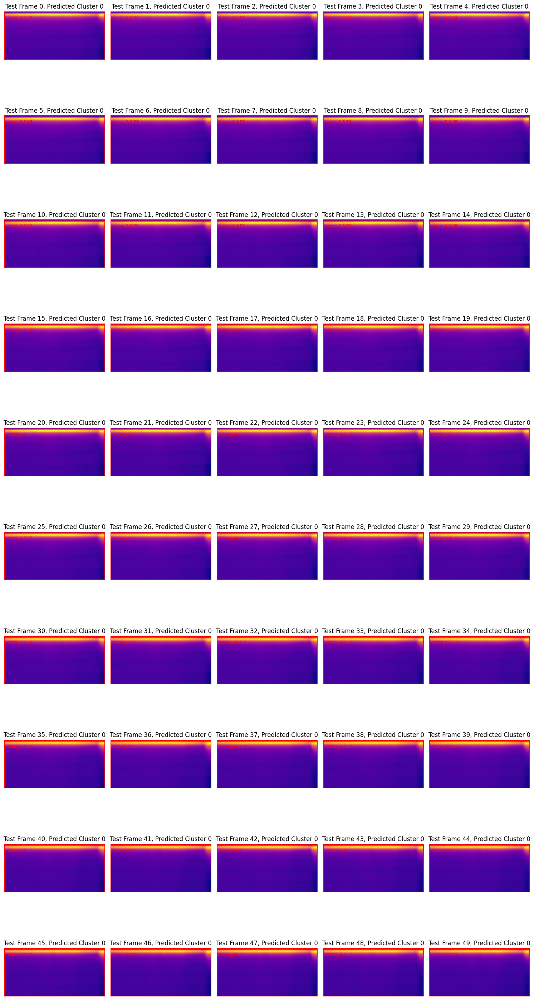

Visualization of representative test frames with bounding boxes for clusters 0 and 1 complete.


In [20]:
import scipy.io
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt
import os

# 1. Load the test data using the user-provided filename
test_data_filename = "/content/P2X1_train_norm.mat" # Use the provided filename
test_mat_data = scipy.io.loadmat(test_data_filename)
# Assuming the relevant data is in the key corresponding to the filename
# Extract the base name of the file without extension to get the key
test_data_key = os.path.splitext(os.path.basename(test_data_filename))[0]
if test_data_key in test_mat_data:
    test_data = test_mat_data[test_data_key]
    print(f"Successfully loaded data from key: {test_data_key}")
else:
    print(f"Could not find data in key '{test_data_key}'. Available keys: {test_mat_data.keys()}")
    # Attempt to find a key that looks like data (e.g., ends with '_train_norm')
    data_keys = [key for key in test_mat_data.keys() if key.endswith('_train_norm')]
    if data_keys:
        test_data_key = data_keys[0]
        test_data = test_mat_data[test_data_key]
        print(f"Attempting to load data from key: {test_data_key}")
    else:
        raise KeyError(f"Could not find a suitable data key in {test_data_filename}")


# 2. Preprocess the test data
preprocessed_test_data = np.transpose(test_data, (2, 0, 1))
# Normalize pixel values to the range [0, 1] - use the same normalization as training
# Find the global max from the training data
# If not, calculate max from test data or use a known range.
# For consistency, 'data' from the original training is available to get the max for normalization
if 'data' in globals():
    global_max_train = data.max()
    preprocessed_test_data = preprocessed_test_data / global_max_train
    print(f"Normalized test data using training data max ({global_max_train})")
else:
     # Fallback: Normalize using the max of the test data itself if training data max is not available
     global_max_test = preprocessed_test_data.max()
     if global_max_test > 0:
         preprocessed_test_data = preprocessed_test_data / global_max_test
         print(f"Normalized test data using test data max ({global_max_test})")
     else:
         print("Test data max is 0 or less, skipping normalization by division.")


# 3. Reshape each frame into a 1D vector (if needed for KMeans prediction, but not for YOLO)
# This step is needed to predict cluster labels with KMeans later
test_features = preprocessed_test_data.reshape(preprocessed_test_data.shape[0], -1)


# 4. Predict cluster labels using the trained KMeans model
if 'kmeans' in globals():
    test_cluster_labels = kmeans.predict(test_features)
    print("Predicted cluster labels for test data.")
else:
    test_cluster_labels = [None] * preprocessed_test_data.shape[0]
    print("KMeans model not available, skipping cluster prediction for test data.")


# 5. Load the trained YOLO model
# List directories in runs/detect/ to find the training run folder
# Look for directories starting with 'train' and sort them to get the latest
train_run_dirs = sorted([d for d in os.listdir('runs/detect') if os.path.isdir(os.path.join('runs/detect', d)) and d.startswith('train')])

model = None
if train_run_dirs:
    latest_train_run_dir = train_run_dirs[-1]
    run_weights_dir = os.path.join('runs/detect', latest_train_run_dir, 'weights')

    # Try loading best.pt first, then last.pt
    model_path_best = os.path.join(run_weights_dir, 'best.pt')
    model_path_last = os.path.join(run_weights_dir, 'last.pt')

    if os.path.exists(model_path_best):
        print(f"Attempting to load model from: {model_path_best}")
        model = YOLO(model_path_best)
    elif os.path.exists(model_path_last):
        print(f"Attempting to load model from: {model_path_last}")
        model = YOLO(model_path_last)
    else:
        print(f"No 'best.pt' or 'last.pt' found in {run_weights_dir}")
        print("Contents of the weights directory:")
        try:
            print(os.listdir(run_weights_dir))
        except FileNotFoundError:
            print(f"Weights directory not found: {run_weights_dir}")
else:
    print("No training run directories found in runs/detect/. Please ensure training completed successfully.")


# 6. Use the trained YOLO model to predict on the preprocessed test data (Optional for this visualization, but keeping the variable)
# This prediction is used for the labels and confidences overlaid, but the bounding box logic is changed
if model:
    test_results = []
    print(f"Running YOLO predictions on {preprocessed_test_data.shape[0]} test frames for overlay...")
    for i in range(preprocessed_test_data.shape[0]):
        frame_255 = (preprocessed_test_data[i] * 255).astype(np.uint8)

        # Convert the 1-channel grayscale frame to a 3-channel format by stacking
        frame_3_channel = np.stack((frame_255,) * 3, axis=-1)

        # YOLO predict expects a list of images or a directory
        # We'll pass individual frames as arrays
        results = model.predict(source=frame_3_channel, verbose=False) # Set verbose=False to reduce output
        test_results.append(results[0]) # results is a list, get the first (and only) result object

    print("YOLO predictions on test data for overlay complete.")
else:
    test_results = [None] * preprocessed_test_data.shape[0] # Create dummy results if model not loaded
    print("YOLO model could not be loaded, skipping predictions for overlay.")


# 7. Visualize a selection of the test frames and draw bounding boxes based on cluster labels 0 and 1
num_frames_to_visualize = 50 # Visualize a subset of frames
if preprocessed_test_data.shape[0] < num_frames_to_visualize:
    num_frames_to_visualize = preprocessed_test_data.shape[0]

n_cols = 5  # Number of columns in the grid
n_rows = (num_frames_to_visualize + n_cols - 1) // n_cols

plt.figure(figsize=(n_cols * 3, n_rows * 3))

print(f"Visualizing {num_frames_to_visualize} test frames with bounding boxes for clusters 0 and 1...")
for i in range(num_frames_to_visualize):
    plt.subplot(n_rows, n_cols, i + 1)

    # Display the original frame
    plt.imshow(test_data[:, :, i], cmap='plasma')
    title = f'Test Frame {i}'

    # Get the predicted cluster label for the current frame
    predicted_cluster = test_cluster_labels[i] if 'test_cluster_labels' in globals() and i < len(test_cluster_labels) else None

    if predicted_cluster is not None:
        title += f', Predicted Cluster {predicted_cluster}'
        # Draw a bounding box if the frame is in Cluster 0 or Cluster 1
        if predicted_cluster in [0, 1]:
            # Draw a bounding box around the whole frame
            height, width = test_data[:, :, i].shape
            rect = plt.Rectangle((0, 0), width - 1, height - 1,
                                 linewidth=2, edgecolor='red', facecolor='none')
            plt.gca().add_patch(rect)


    plt.title(title)
    plt.axis('off')

    # Overlay YOLO predictions (label and confidence) if available
    if test_results[i] and test_results[i].boxes:
         for box in test_results[i].boxes:
                # Get bounding box coordinates in pixels (using YOLO prediction for text location)
                x_min, y_min, x_max, y_max = box.xyxy[0].cpu().numpy()
                confidence = box.conf[0].cpu().numpy()
                class_id = int(box.cls[0].cpu().numpy())
                # Load class names from data.yaml to map predicted class IDs to original cluster labels
                yolo_data_dir = "yolo_dataset"
                config_path = os.path.join(yolo_data_dir, "data.yaml")
                class_names = []
                if os.path.exists(config_path):
                    with open(config_path, 'r') as f:
                        yolo_config = yaml.safe_load(f)
                        if 'names' in yolo_config:
                            class_names = yolo_config['names']

                # Ensure class_names is not empty and class_id is within bounds
                label = class_names[class_id] if class_names and class_id < len(class_names) else f'class_{class_id}'

                # Add label and confidence text (adjust position slightly to avoid overlapping title)
                plt.text(x_min, y_min + 10, f'{label} {confidence:.2f}', fontsize=8, color='red', verticalalignment='top')


plt.tight_layout()
plt.show()

print("Visualization of representative test frames with bounding boxes for clusters 0 and 1 complete.")